### 1. Se pide: (regression)

A partir del archivo "USA_Housing.csv", realizar la regresión no lineal entre cada columna numérica con la columna 'price' utilizando:

- SVR

In [24]:
import pandas as pd

df = pd.read_csv("../data/USA_Housing.csv")
df

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Address
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,"208 Michael Ferry Apt. 674\r\nLaurabury, NE 37..."
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,"188 Johnson Views Suite 079\r\nLake Kathleen, ..."
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,"9127 Elizabeth Stravenue\r\nDanieltown, WI 064..."
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,USS Barnett\r\nFPO AP 44820
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,USNS Raymond\r\nFPO AE 09386
...,...,...,...,...,...,...,...
4995,60567.944140,7.830362,6.137356,3.46,22837.361035,1.060194e+06,USNS Williams\r\nFPO AP 30153-7653
4996,78491.275435,6.999135,6.576763,4.02,25616.115489,1.482618e+06,"PSC 9258, Box 8489\r\nAPO AA 42991-3352"
4997,63390.686886,7.250591,4.805081,2.13,33266.145490,1.030730e+06,"4215 Tracy Garden Suite 076\r\nJoshualand, VA ..."
4998,68001.331235,5.534388,7.130144,5.44,42625.620156,1.198657e+06,USS Wallace\r\nFPO AE 73316


In [25]:
df = df.drop("Address", axis=1)

In [26]:
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.svm import SVR
import matplotlib.pyplot as plt

In [27]:
def regression(column):
    X = np.array(df[column]).reshape(-1, 1)
    y = np.array(df["Price"])
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=4)
    print(X_train.shape)
    print(X_test.shape)
    svr_rbf = SVR()
    model = svr_rbf.fit(X_train, y_train)
    print("train score:", model.score(X_train, y_train))
    print("test score:", model.score(X_test, y_test))

    y_prediction = model.predict(X)
    plt.scatter(X, y, color='red')
    plt.scatter(X, y_prediction, color='green', alpha=0.3)
    plt.plot(X, y_prediction, color='green')
    

(4000, 1)
(1000, 1)
train score: 0.0013119771385015078
test score: 0.0012754233119542935


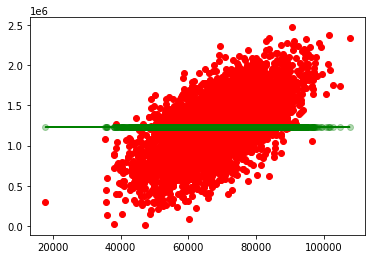

In [28]:
regression("Avg. Area Income")

(4000, 1)
(1000, 1)
train score: 0.0007120249298012693
test score: 0.0005557869244640079


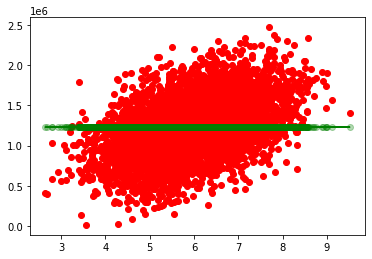

In [29]:
regression("Avg. Area House Age")

(4000, 1)
(1000, 1)
train score: 4.6256670241162645e-05
test score: -6.911315516666683e-05


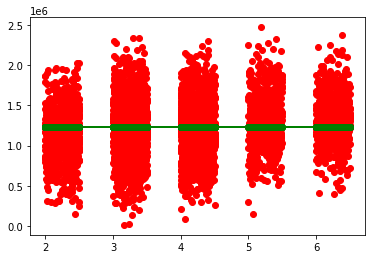

In [30]:
regression("Avg. Area Number of Bedrooms")

(4000, 1)
(1000, 1)
train score: 0.0005424283045755152
test score: 0.0003382822639506067


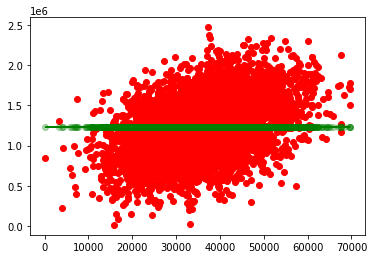

In [31]:
regression("Area Population")

### 2. Se pide: (classification)

En el anterior dataset, la columna "Avg. Area Number of Bedrooms" está en un rango numérico limitado:

1. Cambia todos los datos para que sean enteros redondeando hacia el entero más cercano. Si es .5 exacto, se redondea hacia abajo.

2. Cuando lo hayas hecho, tendrás una columna con números enteros en un rango limitado. Ahora trata a esa columna como una serie de valores discretos (classes, labels). 

3. Usando las demás columnas numéricas y una a una, utiliza SVM (SVC) para clasificar esa columna modificada.

4. Usando todas las demás columnas a la vez ¿hace aumentar el score? ¿por qué? 

5. ¿Qué columna tiene mejor correlación con "Avg. Area Number of Bedrooms" una vez modificada? ¿qué columna da mejor score para nuestro target? 


In [32]:
from decimal import Decimal, ROUND_HALF_DOWN

In [33]:
df["Avg. Area Number of Bedrooms"] = df["Avg. Area Number of Bedrooms"].apply(lambda x: Decimal(str(x)).quantize(Decimal('0'), rounding=ROUND_HALF_DOWN))

In [34]:
df["Avg. Area Number of Bedrooms"] = df["Avg. Area Number of Bedrooms"].astype(int)

In [35]:
y = np.array(df['Avg. Area Number of Bedrooms'])

In [36]:
from sklearn import svm
from visualize_boundary_linear import visualize_boundary_linear
from sklearn.model_selection import train_test_split

In [37]:
def svm_svc(column):
    X = np.array(df[column]).reshape(-1, 1)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=11)
    clf = svm.LinearSVC()
    clf.fit(X_train, y_train)
    print ('score:', clf.score(X_train, y_train))
    print ('score:', clf.score(X_test, y_test))
    y_prediction = clf.predict(X)
    plt.scatter(X, y, color='blue')
    plt.scatter(X, y_prediction, color='green', alpha=0.5)
    plt.plot(X, y_prediction, color='green')



C:\Users\xyang\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\svm\_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
score: 0.303
score: 0.296


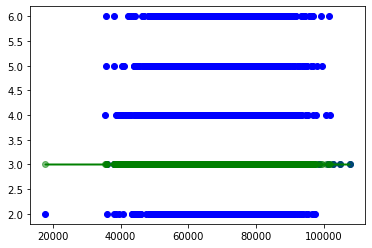

In [38]:
svm_svc("Avg. Area Income")

C:\Users\xyang\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\svm\_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
score: 0.30175
score: 0.308


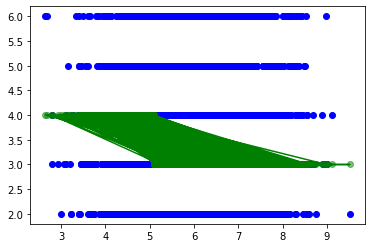

In [39]:
svm_svc("Avg. Area House Age")

C:\Users\xyang\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\svm\_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
score: 0.303
score: 0.296


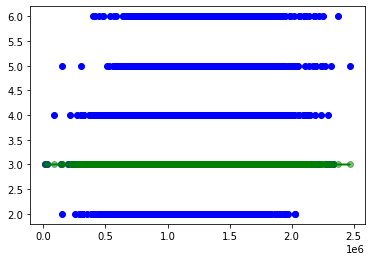

In [40]:
svm_svc("Price")

C:\Users\xyang\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\svm\_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
score: 0.1265
score: 0.107


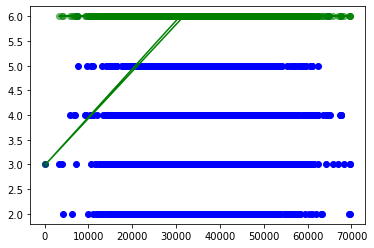

In [41]:
svm_svc("Area Population")

In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 6 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Avg. Area Income              5000 non-null   float64
 1   Avg. Area House Age           5000 non-null   float64
 2   Avg. Area Number of Rooms     5000 non-null   float64
 3   Avg. Area Number of Bedrooms  5000 non-null   int32  
 4   Area Population               5000 non-null   float64
 5   Price                         5000 non-null   float64
dtypes: float64(5), int32(1)
memory usage: 215.0 KB


In [44]:
X = df.drop("Avg. Area Number of Bedrooms", axis=1)
y = np.array(df["Avg. Area Number of Bedrooms"]).reshape(-1, 1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=11)
clf = svm.LinearSVC()
clf.fit(X_train, y_train)

print ('score:', clf.score(X_train, y_train))
print ('score:', clf.score(X_test, y_test))

C:\Users\xyang\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
score: 0.3005
score: 0.294
C:\Users\xyang\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\svm\_base.py:986: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


Aumenta depende de con qué columna la comparamos

Con el que mejor: "Area house Age"